In [11]:
import cv2
import mediapipe as mp
import matplotlib.pyplot as plt
import os
import numpy as np

# Specify the path to the folder containing the videos
rep = "/Users/tomhucke/TrainingCompanion/training-companion/ml/videos/squat/rep_twelve-squat-correct-tom.mp4"
print(os.path.exists(rep))

mp_pose = mp.solutions.pose
pose = mp_pose.Pose(static_image_mode=True, min_detection_confidence=0.5)

True


I0000 00:00:1701424581.478729       1 gl_context.cc:344] GL version: 2.1 (2.1 Metal - 88), renderer: Apple M2


### Extract frames from the Video


In [2]:
def extract_frames_and_pose(rep, framerate=1):
    video = cv2.VideoCapture(rep)
    count = 0

    while video.isOpened():
        ret, frame = video.read()
        if not ret:
            break
        if count % framerate == 0:
            rgb_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            results = pose.process(rgb_frame)
            yield frame, results

        count += 1
    video.release()

### Visualize Pose Estimation

In [3]:
def draw_pose(frame, results):
    mp_drawing = mp.solutions.drawing_utils
    annotated_image = frame.copy()
    mp_drawing.draw_landmarks(annotated_image, results.pose_landmarks, mp.solutions.pose.POSE_CONNECTIONS)
    return annotated_image

In [4]:
def calculate_angle(a, b, c):
    # Ensure the coordinates are in the correct format
    if not (len(a) == len(b) == len(c) == 2):
        print("Error: Invalid input to calculate_angle function")
        return None

    # Calculate vectors
    ba = np.array(a) - np.array(b)
    bc = np.array(c) - np.array(b)

    # Calculate the cosine of the angle
    cosine_angle = np.dot(ba, bc) / (np.linalg.norm(ba) * np.linalg.norm(bc))
    
    # Ensure the value lies in the domain of acos function to avoid runtime error
    cosine_angle = np.clip(cosine_angle, -1, 1)

    # Calculate the angle and convert to degrees
    angle = np.arccos(cosine_angle)
    angle = np.degrees(angle)

    return angle

In [5]:
def calculate_relative_pos(a,b):
    return np.array(a) - np.array(b)

In [9]:
def calculate_distance(a,b):
    return np.linalg.norm(np.array(a) - np.array(b))    

Left angle: 176.97917037054447, Right angle: 177.07826862239196, Relative Position: [0.01816869 0.00807051], Squat depth: 0.18883826626715666, Knee position: 0.21997676737672459


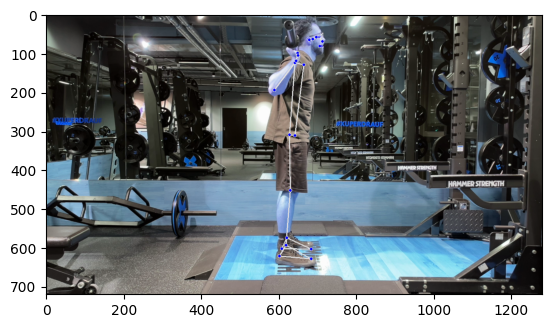

Left angle: 179.13256445130108, Right angle: 178.76068126657356, Relative Position: [0.01458657 0.00651985], Squat depth: 0.18491496354300305, Knee position: 0.21839305632850123


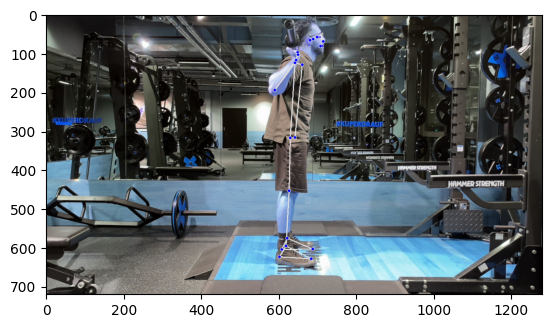

Left angle: 177.64547622515082, Right angle: 177.9967350054919, Relative Position: [0.01573628 0.00637612], Squat depth: 0.18180208680707174, Knee position: 0.21721281963550995


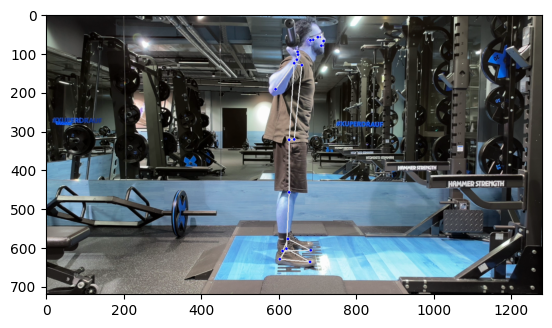

Left angle: 176.9842048732944, Right angle: 177.52623624938596, Relative Position: [0.0166654  0.00560549], Squat depth: 0.1871690085460405, Knee position: 0.21555208289673133


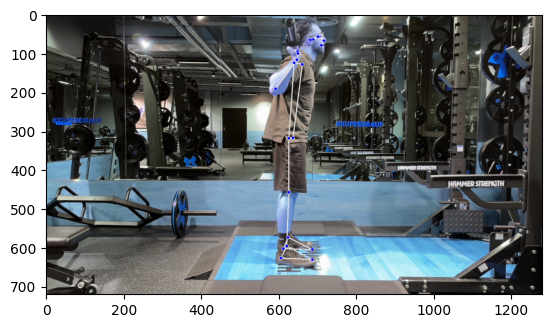

Left angle: 172.60861576289497, Right angle: 173.3168254717107, Relative Position: [0.01448405 0.00586607], Squat depth: 0.18314303568339088, Knee position: 0.21766556843580392


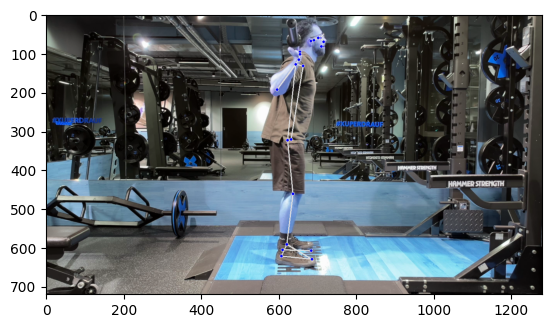

Left angle: 165.8103842170182, Right angle: 163.01036772972097, Relative Position: [0.00738502 0.00652745], Squat depth: 0.18535791638538024, Knee position: 0.2234926759337409


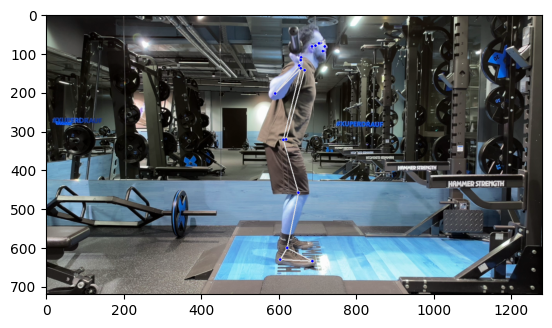

Left angle: 159.05235931984606, Right angle: 154.9555809727758, Relative Position: [0.00657886 0.00997457], Squat depth: 0.17381940388983375, Knee position: 0.20823088405309048


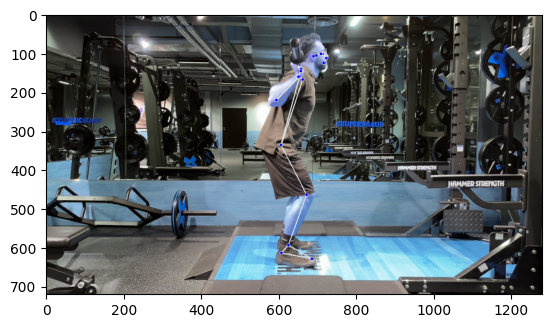

Left angle: 155.8321657078963, Right angle: 147.57595994056084, Relative Position: [0.00866276 0.00786409], Squat depth: 0.16827644424693103, Knee position: 0.22236203101810337


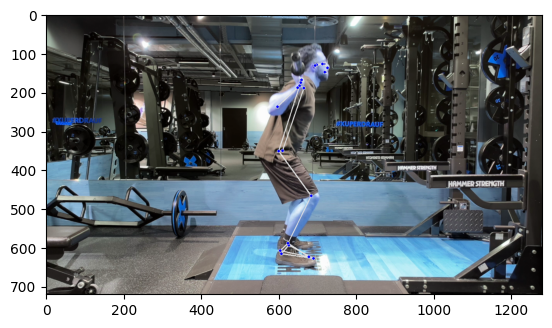

Left angle: 147.41303266949953, Right angle: 138.42099483202085, Relative Position: [0.00715488 0.00866663], Squat depth: 0.15963713974964985, Knee position: 0.19755298133589602


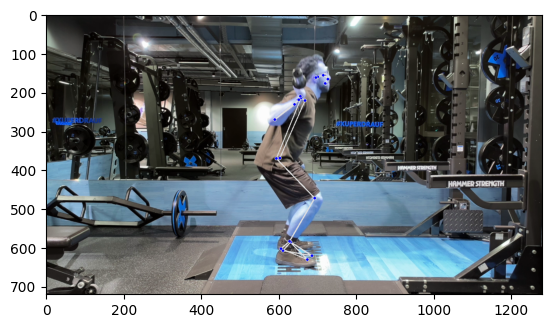

Left angle: 139.35620967677966, Right angle: 130.16827505300247, Relative Position: [0.00336277 0.00580108], Squat depth: 0.14495914894132914, Knee position: 0.188852040132056


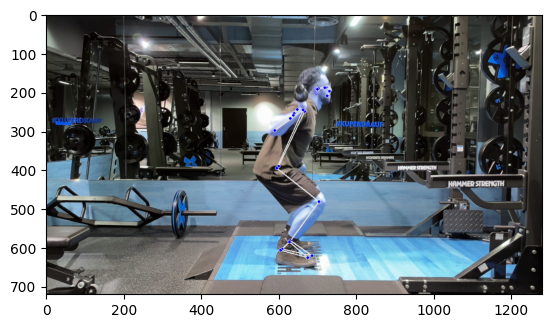

Left angle: 123.81841019205194, Right angle: 119.62672742189959, Relative Position: [0.00997317 0.00617865], Squat depth: 0.1157920726486975, Knee position: 0.19078411202815915


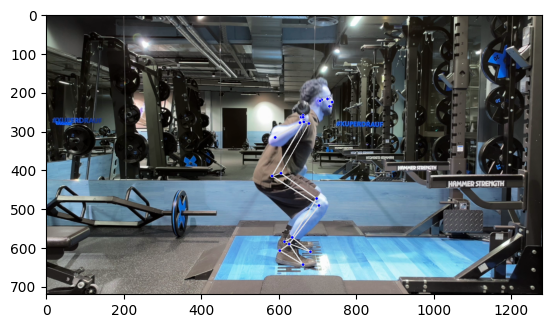

Left angle: 109.77855762805542, Right angle: 107.84785408582097, Relative Position: [0.008205   0.00307193], Squat depth: 0.10310731271251428, Knee position: 0.16716647224077247


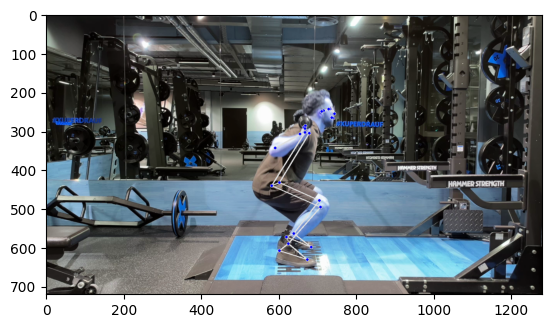

Left angle: 93.28690595768892, Right angle: 98.76942133731572, Relative Position: [0.01673943 0.00438622], Squat depth: 0.08706319981821968, Knee position: 0.14737456727279372


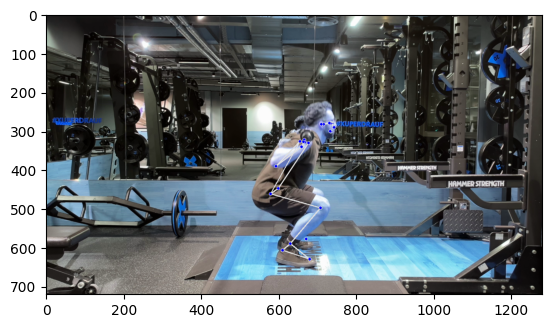

Left angle: 77.33038972489516, Right angle: 79.06142712580682, Relative Position: [ 0.00970566 -0.00980133], Squat depth: 0.0867560529036504, Knee position: 0.1504949290808181


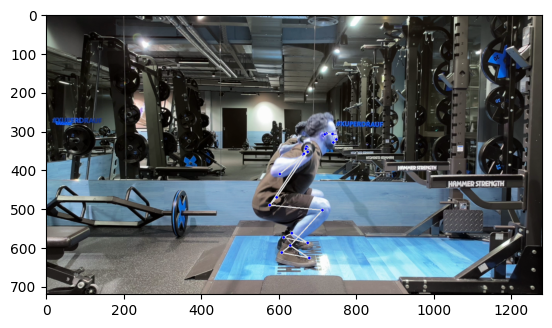

Left angle: 70.93868263308985, Right angle: 71.15858464900735, Relative Position: [ 0.01410043 -0.01654041], Squat depth: 0.08884335020415975, Knee position: 0.13823137892058673


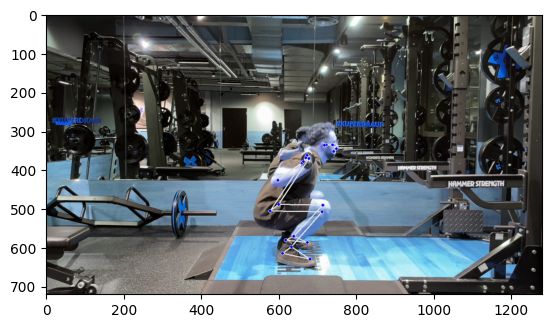

Left angle: 72.31534717640115, Right angle: 72.86085935330965, Relative Position: [0.02092469 0.00081968], Squat depth: 0.08129154797786918, Knee position: 0.1465998185815735


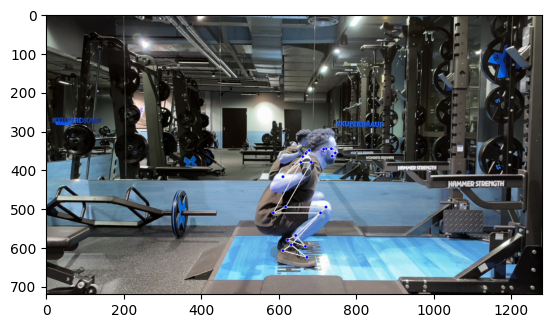

Left angle: 69.9165029270553, Right angle: 69.3247838509419, Relative Position: [ 0.01356059 -0.00721228], Squat depth: 0.08590519790386794, Knee position: 0.13579211469393956


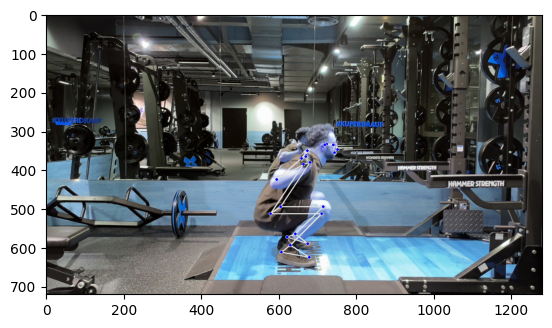

Left angle: 80.70554000704729, Right angle: 86.40608597970738, Relative Position: [ 0.0209986 -0.0036175], Squat depth: 0.08469063690654083, Knee position: 0.15244111573192504


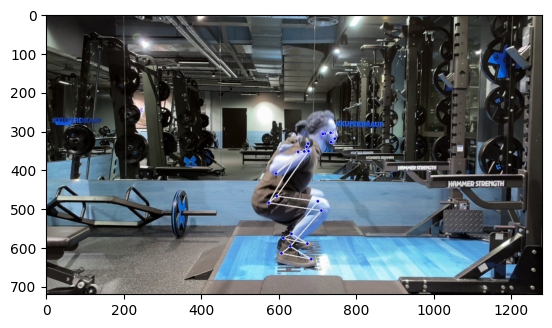

Left angle: 106.81662807568924, Right angle: 105.28264605367156, Relative Position: [0.01660126 0.00764522], Squat depth: 0.09565719487506814, Knee position: 0.15775636716876004


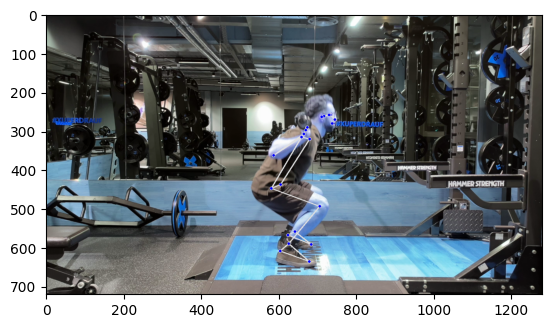

Left angle: 121.27643801611305, Right angle: 119.20953789239998, Relative Position: [0.01044905 0.01166517], Squat depth: 0.11151873948979342, Knee position: 0.18747875772853123


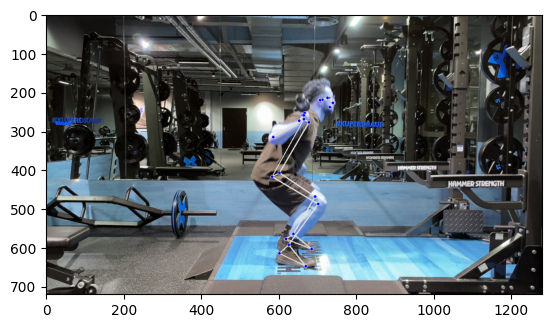

Left angle: 138.77877384398343, Right angle: 131.59254286820092, Relative Position: [0.00316662 0.00611895], Squat depth: 0.1320245791642064, Knee position: 0.2127462208841601


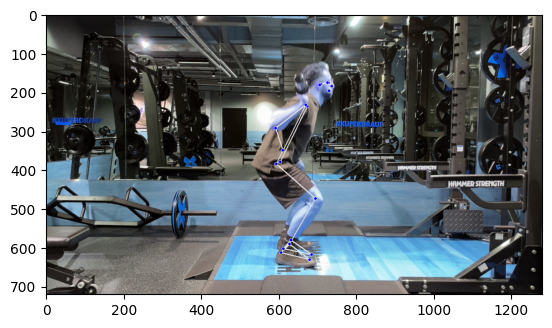

Left angle: 154.80369082076905, Right angle: 146.95937512633418, Relative Position: [0.01270741 0.00841156], Squat depth: 0.16060728355758258, Knee position: 0.2094098353023959


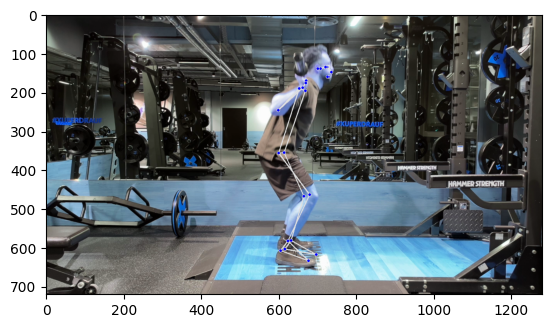

Left angle: 160.14319509051919, Right angle: 156.18368359542592, Relative Position: [0.00917214 0.00839791], Squat depth: 0.1647497167089147, Knee position: 0.21787258024803347


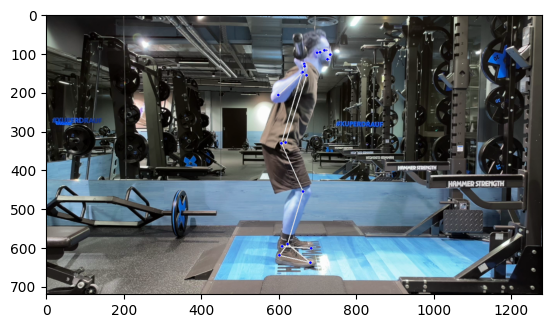

Left angle: 169.24983415318792, Right angle: 169.04574050054987, Relative Position: [0.01548207 0.01052772], Squat depth: 0.18141966859147088, Knee position: 0.21371864851161518


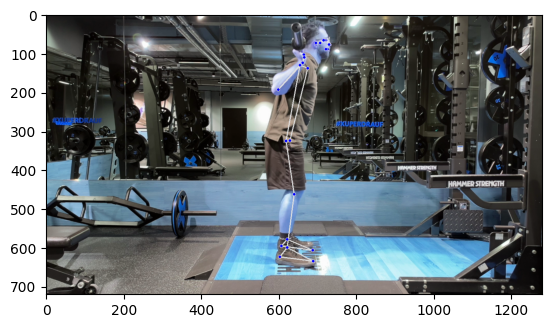

Left angle: 174.84737425097265, Right angle: 176.84760130400974, Relative Position: [0.01394457 0.0110794 ], Squat depth: 0.18581839370295733, Knee position: 0.22246978856652308


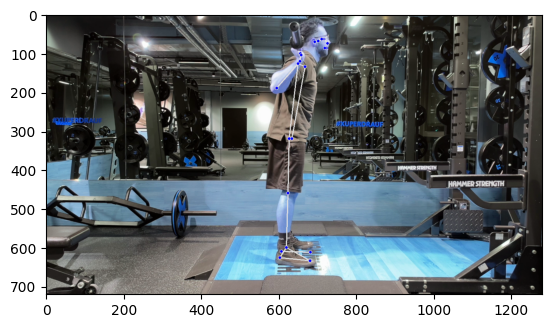

Left angle: 177.84995370742143, Right angle: 178.3841181236346, Relative Position: [0.01247907 0.0130024 ], Squat depth: 0.1910979459661073, Knee position: 0.22002828439319788


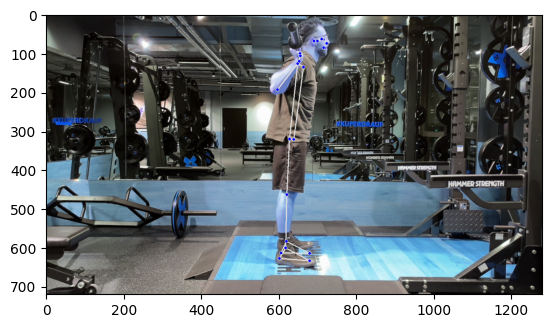

Left angle: 177.28443720256615, Right angle: 178.29937945098334, Relative Position: [0.01637012 0.01115175], Squat depth: 0.1852408597451207, Knee position: 0.2157722025746893


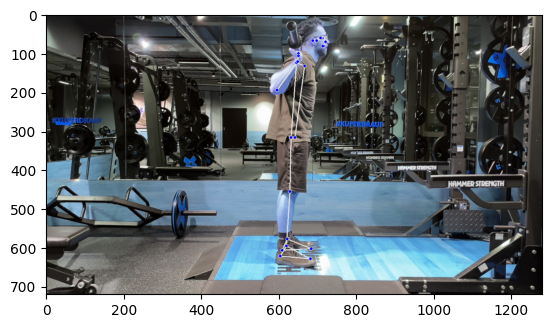

Left angle: 178.00756619048553, Right angle: 178.12609744101414, Relative Position: [0.01451844 0.01232736], Squat depth: 0.18906593373414096, Knee position: 0.21763531006939915


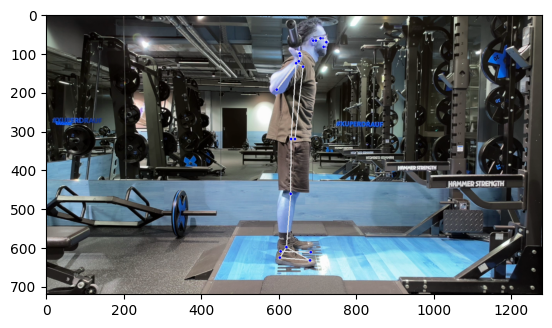

Left angle: 177.00432779600604, Right angle: 178.3400144940845, Relative Position: [0.01357991 0.01462333], Squat depth: 0.18506824912890435, Knee position: 0.21482172520884765


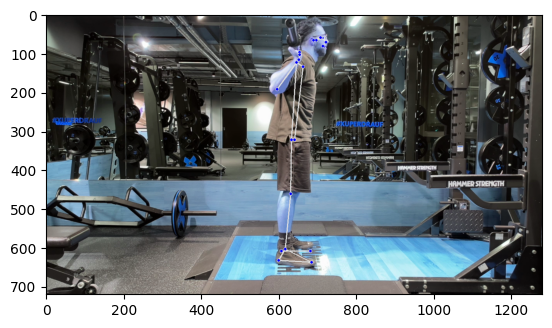

Left angle: 175.82156693223254, Right angle: 177.59323782361702, Relative Position: [0.01011097 0.01362929], Squat depth: 0.18565359003578974, Knee position: 0.2142993892518994


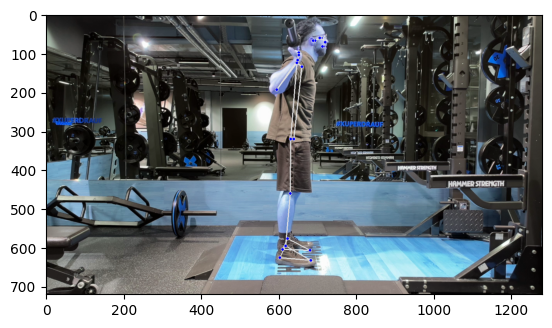

In [12]:
frame_pose_generator = extract_frames_and_pose(rep, framerate=8)

for i in range(30):
    frame, results = next(frame_pose_generator)
    if results.pose_landmarks is not None:
        # Extract the landmarks we're interested in.
        left_shoulder = [results.pose_landmarks.landmark[mp_pose.PoseLandmark.LEFT_SHOULDER].x, results.pose_landmarks.landmark[mp_pose.PoseLandmark.LEFT_SHOULDER].y]
        left_hip = [results.pose_landmarks.landmark[mp_pose.PoseLandmark.LEFT_HIP].x, results.pose_landmarks.landmark[mp_pose.PoseLandmark.LEFT_HIP].y]
        left_knee = [results.pose_landmarks.landmark[mp_pose.PoseLandmark.LEFT_KNEE].x, results.pose_landmarks.landmark[mp_pose.PoseLandmark.LEFT_KNEE].y]

        right_shoulder = [results.pose_landmarks.landmark[mp_pose.PoseLandmark.RIGHT_SHOULDER].x, results.pose_landmarks.landmark[mp_pose.PoseLandmark.RIGHT_SHOULDER].y]
        right_hip = [results.pose_landmarks.landmark[mp_pose.PoseLandmark.RIGHT_HIP].x, results.pose_landmarks.landmark[mp_pose.PoseLandmark.RIGHT_HIP].y]
        right_knee = [results.pose_landmarks.landmark[mp_pose.PoseLandmark.RIGHT_KNEE].x, results.pose_landmarks.landmark[mp_pose.PoseLandmark.RIGHT_KNEE].y]

        # Calculate the angle.
        left_angle = calculate_angle(left_shoulder, left_hip, left_knee)
        right_angle = calculate_angle(right_shoulder, right_hip, right_knee)
        relative_pos = calculate_relative_pos(left_shoulder, right_shoulder)

        # Calculate Knee Position
        left_toe = [results.pose_landmarks.landmark[mp_pose.PoseLandmark.LEFT_FOOT_INDEX].x, results.pose_landmarks.landmark[mp_pose.PoseLandmark.LEFT_FOOT_INDEX].y]
        knee_pos = calculate_distance(left_knee, left_toe)

        # Calculate Squat Depth
        squat_depth = calculate_distance(left_hip, left_knee)

        print(f'Left angle: {left_angle}, Right angle: {right_angle}, Relative Position: {relative_pos}, Squat depth: {squat_depth}, Knee position: {knee_pos}')

    plt.imshow(draw_pose(frame, results))
    plt.show()

In [3]:
# First Try Feature Engineering Side Squat View
import cv2
import mediapipe as mp
import numpy as np
import pandas as pd

In [2]:
# 1. Initializing the mediapipe pose class

mp_pose = mp.solutions.pose
pose  = mp_pose.Pose(static_image_mode=False, model_complexity=1, min_detection_confidence=0.5, min_tracking_confidence=0.5)

I0000 00:00:1704787089.193979       1 gl_context.cc:344] GL version: 2.1 (2.1 Metal - 88), renderer: Apple M2


INFO: Created TensorFlow Lite XNNPACK delegate for CPU.


In [67]:
# 2. Creating Helper Functions for Feature Extraction

def calculate_angle(a, b, c):
    a = np.array(a)  # First
    b = np.array(b)  # Mid
    c = np.array(c)  # End
    
    radians = np.arctan2(c[1]-b[1], c[0]-b[0]) - np.arctan2(a[1]-b[1], a[0]-b[0])
    angle = np.abs(radians*180.0/np.pi)
    
    if angle > 180.0:
        angle = 360-angle
        
    return angle 

def calculate_distance(point1, point2):
    return np.linalg.norm(np.array(point1) - np.array(point2))

def calculate_relative_position(reference, target):
    # Calculate the relative position of the target joint with respect to the reference joint
    relative_position = np.array(target) - np.array(reference)
    return relative_position.tolist()

In [189]:
def process_video_for_squat(video_path):
    cap = cv2.VideoCapture(video_path)
    feature_rows = []

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        results = pose.process(frame_rgb)

        if results.pose_landmarks:
            landmarks = results.pose_landmarks.landmark
            
            # Define keypoints
            shoulder = [landmarks[mp_pose.PoseLandmark.RIGHT_SHOULDER.value].x, landmarks[mp_pose.PoseLandmark.RIGHT_SHOULDER.value].y]
            hip = [landmarks[mp_pose.PoseLandmark.RIGHT_HIP.value].x, landmarks[mp_pose.PoseLandmark.RIGHT_HIP.value].y]
            knee = [landmarks[mp_pose.PoseLandmark.RIGHT_KNEE.value].x, landmarks[mp_pose.PoseLandmark.RIGHT_KNEE.value].y]
            ankle = [landmarks[mp_pose.PoseLandmark.RIGHT_ANKLE.value].x, landmarks[mp_pose.PoseLandmark.RIGHT_ANKLE.value].y]

            # Reference distance (e.g., hip to shoulder)
            ref_distance = calculate_distance(hip, shoulder)

            # Calculate distances
            knee_to_ankle_distance = calculate_distance(knee, ankle)
            hip_to_floor_distance = calculate_distance(hip, [hip[0], 1])  # Simplified floor distance

            # Calculate relative positions
            knee_rel_to_ankle = calculate_relative_position(knee, ankle)
            ankle_rel_to_ankle = calculate_relative_position(ankle, ankle)
            hip_rel_to_ankle = calculate_relative_position(hip, ankle)

            # Calculate angles
            knee_angle = calculate_angle(hip, knee, ankle)
            hip_angle = calculate_angle(shoulder, hip, knee)

            # Append to feature rows
            feature_rows.append([
                knee_angle, hip_angle, 
                knee_to_ankle_distance, hip_to_floor_distance,
                hip_rel_to_ankle[0], hip_rel_to_ankle[1], 
                knee_rel_to_ankle[0], knee_rel_to_ankle[1], 
                ankle_rel_to_ankle[0], ankle_rel_to_ankle[1]
            ])

    cap.release()

    # Define columns for DataFrame
    columns = [
        'knee_angle', 'hip_angle', 
        'knee_to_ankle_distance', 'hip_to_floor_distance', 
        'hip_rel_x', 'hip_rel_y',
        'knee_rel_x', 'knee_rel_y', 
        'ankle_rel_x', 'ankle_rel_y'
    ]
    return pd.DataFrame(feature_rows, columns=columns)


In [190]:
# 4. Process the Video and create Dataframe

video_path = "/Users/tomhucke/TrainingCompanion/training-companion/ml/videos/squat/rep_three-squat-correct-tom.mp4"
squat_df = process_video_for_squat(video_path)

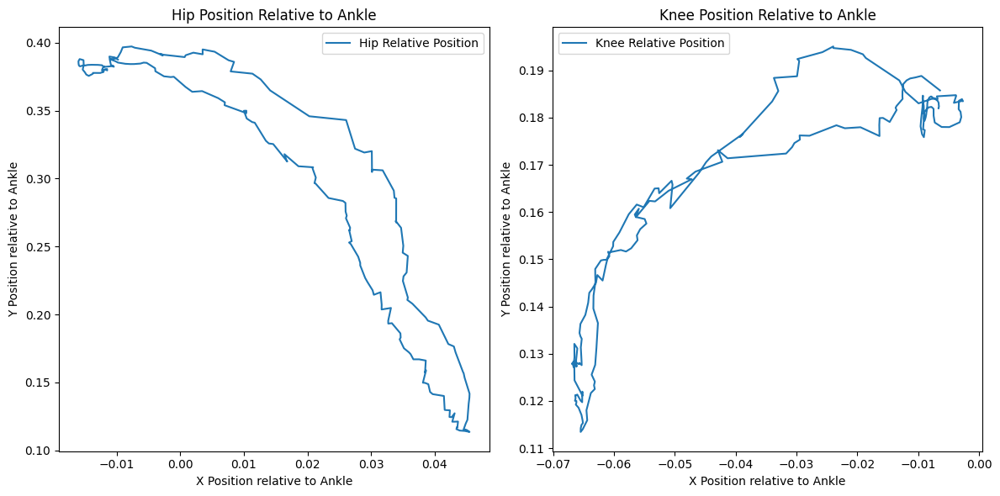

In [191]:
import matplotlib.pyplot as plt
# Plotting
plt.figure(figsize=(12, 6))

# Hip relative position
plt.subplot(1, 2, 1)
plt.plot(squat_df['hip_rel_x'], squat_df['hip_rel_y'], label='Hip Relative Position')
plt.xlabel('X Position relative to Ankle')
plt.ylabel('Y Position relative to Ankle')
plt.title('Hip Position Relative to Ankle')
plt.legend()

# Knee relative position
plt.subplot(1, 2, 2)
plt.plot(squat_df['knee_rel_x'], squat_df['knee_rel_y'], label='Knee Relative Position')
plt.xlabel('X Position relative to Ankle')
plt.ylabel('Y Position relative to Ankle')
plt.title('Knee Position Relative to Ankle')
plt.legend()

plt.tight_layout()
plt.show()


In [84]:
squat_df

,knee_angle,hip_angle,knee_to_ankle_distance,hip_to_floor_distance,hip_rel_x,hip_rel_y,knee_rel_x,knee_rel_y,ankle_rel_x,ankle_rel_y
0,178.286588,178.309808,0.167743,0.558156,-0.010224,0.348695,-0.007519,0.167575,0.0,0.0
1,178.305326,178.344020,0.168480,0.558112,-0.010218,0.350318,-0.007498,0.168313,0.0,0.0
2,178.318156,178.371279,0.168880,0.558018,-0.010209,0.351603,-0.007477,0.168714,0.0,0.0
3,178.329999,178.382863,0.169722,0.558184,-0.010200,0.353150,-0.007469,0.169557,0.0,0.0
4,178.335467,178.390259,0.170469,0.558376,-0.010212,0.354600,-0.007478,0.170305,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...
235,177.569989,177.840649,0.175730,0.563708,-0.014583,0.362683,-0.010900,0.175392,0.0,0.0
236,177.572249,177.829331,0.175759,0.563707,-0.014641,0.362680,-0.010926,0.175419,0.0,0.0
237,177.542833,177.793058,0.175628,0.563657,-0.014732,0.362413,-0.011014,0.175282,0.0,0.0
238,177.524067,177.782215,0.175533,0.563565,-0.014802,0.362177,-0.011075,0.175184,0.0,0.0


In [192]:

def calculate_thigh_to_floor_angle(hip, knee):
    # Assuming the floor is parallel to the x-axis of the frame
    # and the y-coordinate increases from top to bottom:
    # A horizontal line through the knee has the same y-coordinate as the knee
    # The x-coordinate can be any value that is not the x-coordinate of the knee
    # (for example, knee[0] + 1 to make a horizontal line to the right)
    horizontal = (knee[0] + 1, knee[1])
    
    # Use the calculate_angle function you defined earlier
    angle = calculate_angle(hip, knee, horizontal)
    
    # Since we want the angle relative to the floor, we subtract it from 90 degrees
    # This is because the pose estimation gives the angle with respect to the horizontal,
    # but we want the complement to that angle (the thigh's lift from the horizontal)
    thigh_to_floor_angle = 90 - angle
    
    return thigh_to_floor_angle

# Apply the function to each row in your DataFrame
squat_df['thigh_to_floor_angle'] = squat_df.apply(
    lambda row: calculate_thigh_to_floor_angle(
        [row['hip_rel_x'], row['hip_rel_y']], 
        [row['knee_rel_x'], row['knee_rel_y']]
    ), axis=1)


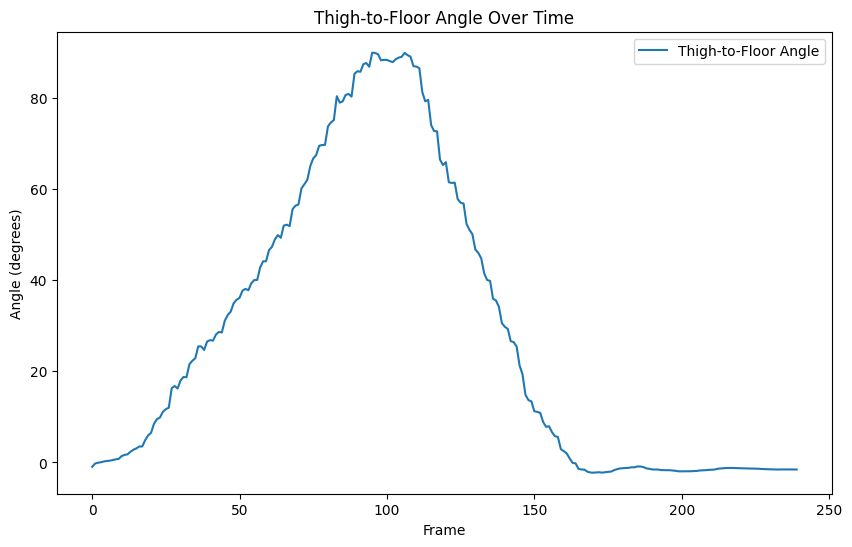

In [193]:
# Plotting the thigh-to-floor angle
plt.figure(figsize=(10, 6))
plt.plot(squat_df['thigh_to_floor_angle'], label='Thigh-to-Floor Angle')
plt.xlabel('Frame')
plt.ylabel('Angle (degrees)')
plt.title('Thigh-to-Floor Angle Over Time')
plt.legend()
plt.show()


In [194]:
squat_df['thigh_to_floor_angle'].describe()

count    240.000000
mean      27.997105
std       32.049900
min       -2.258111
25%       -1.273764
50%       15.549233
75%       52.254654
max       89.970332
Name: thigh_to_floor_angle, dtype: float64

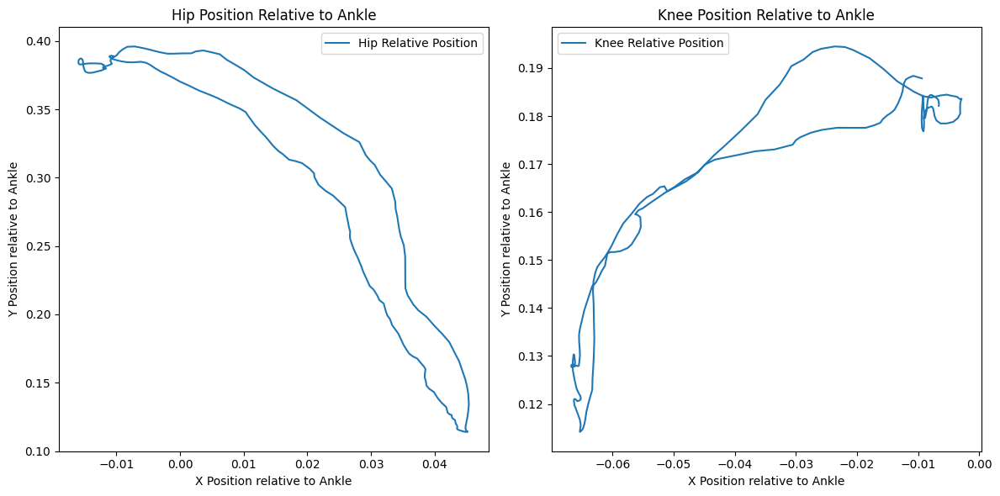

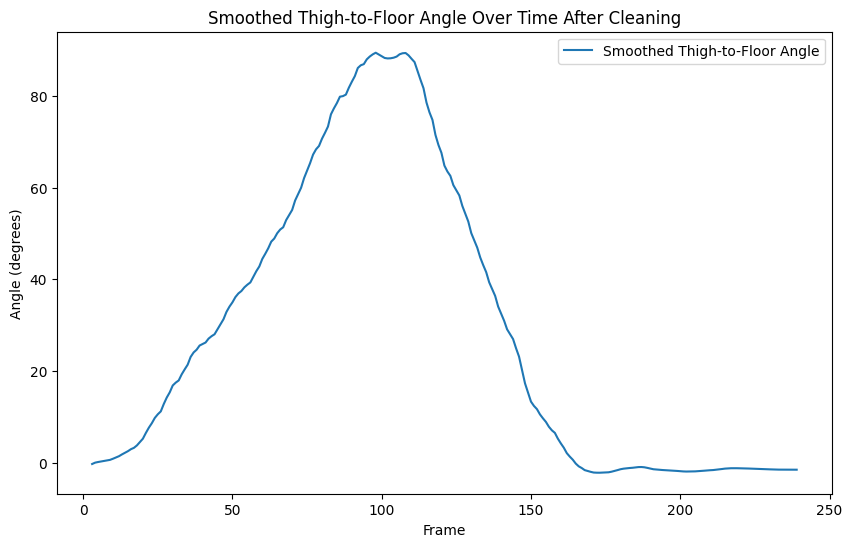

In [195]:
# NOW WE CLEAN DATA BEFORE GRADING

# 1. Remove null values
# Check for missing values
#squat_df_cleaned = squat_df.drop('knee_to_ankle_distance')
squat_df_cleaned = squat_df.dropna()

# 2. Smoothing Data
# Apply a simple moving average with a window size you find appropriate
window_size = 4  # Example window size
squat_df_cleaned['thigh_to_floor_angle_smooth'] = squat_df_cleaned['thigh_to_floor_angle'].rolling(window=window_size).mean()
squat_df_cleaned['hip_rel_x'] = squat_df_cleaned['hip_rel_x'].rolling(window=window_size).mean()
squat_df_cleaned['hip_rel_y'] = squat_df_cleaned['hip_rel_y'].rolling(window=window_size).mean()
squat_df_cleaned['knee_rel_x'] = squat_df_cleaned['knee_rel_x'].rolling(window=window_size).mean()
squat_df_cleaned['knee_rel_y'] = squat_df_cleaned['knee_rel_y'].rolling(window=window_size).mean()

# 3. Removing Outliers
# Simple statistical method
# Assume that any data point outside of 3 standard deviations is an outlier
threshold = 3
angle_mean = squat_df_cleaned['thigh_to_floor_angle_smooth'].mean()
angle_std = squat_df_cleaned['thigh_to_floor_angle_smooth'].std()

outliers = (squat_df_cleaned['thigh_to_floor_angle_smooth'] < angle_mean - threshold * angle_std) | (squat_df_cleaned['thigh_to_floor_angle_smooth'] > angle_mean + threshold * angle_std)
squat_df_cleaned = squat_df_cleaned[~outliers]
hip_x_mean = squat_df_cleaned['hip_rel_x'].mean()
hip_x_std = squat_df_cleaned['hip_rel_x'].std()
hip_y_mean = squat_df_cleaned['hip_rel_y'].mean()
hip_y_std = squat_df_cleaned['hip_rel_y'].std()
knee_x_mean = squat_df_cleaned['knee_rel_x'].mean()
knee_x_std = squat_df_cleaned['knee_rel_x'].std()
knee_y_mean = squat_df_cleaned['knee_rel_y'].mean()
knee_y_std = squat_df_cleaned['knee_rel_y'].std()

outliers = (squat_df_cleaned['hip_rel_x'] < hip_x_mean - threshold * hip_x_std) | (squat_df_cleaned['hip_rel_x'] > hip_x_mean + threshold * hip_x_std)
squat_df_cleaned = squat_df_cleaned[~outliers]
outliers = (squat_df_cleaned['hip_rel_y'] < hip_y_mean - threshold * hip_y_std) | (squat_df_cleaned['hip_rel_y'] > hip_y_mean + threshold * hip_y_std)
squat_df_cleaned = squat_df_cleaned[~outliers]
outliers = (squat_df_cleaned['knee_rel_x'] < knee_x_mean - threshold * knee_x_std) | (squat_df_cleaned['knee_rel_x'] > knee_x_mean + threshold * knee_x_std)
squat_df_cleaned = squat_df_cleaned[~outliers]
outliers = (squat_df_cleaned['knee_rel_y'] < knee_y_mean - threshold * knee_y_std) | (squat_df_cleaned['knee_rel_y'] > knee_y_mean + threshold * knee_y_std)
squat_df_cleaned = squat_df_cleaned[~outliers]

 # 6. Validate by Visualization

 # Re-plot some of your cleaned data to make sure it looks correct
plt.figure(figsize=(12, 6))

# Hip relative position
plt.subplot(1, 2, 1)
plt.plot(squat_df_cleaned['hip_rel_x'], squat_df_cleaned['hip_rel_y'], label='Hip Relative Position')
plt.xlabel('X Position relative to Ankle')
plt.ylabel('Y Position relative to Ankle')
plt.title('Hip Position Relative to Ankle')
plt.legend()

# Knee relative position
plt.subplot(1, 2, 2)
plt.plot(squat_df_cleaned['knee_rel_x'], squat_df_cleaned['knee_rel_y'], label='Knee Relative Position')
plt.xlabel('X Position relative to Ankle')
plt.ylabel('Y Position relative to Ankle')
plt.title('Knee Position Relative to Ankle')
plt.legend()

plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 6))
plt.plot(squat_df_cleaned['thigh_to_floor_angle_smooth'], label='Smoothed Thigh-to-Floor Angle')
plt.xlabel('Frame')
plt.ylabel('Angle (degrees)')
plt.title('Smoothed Thigh-to-Floor Angle Over Time After Cleaning')
plt.legend()
plt.show()



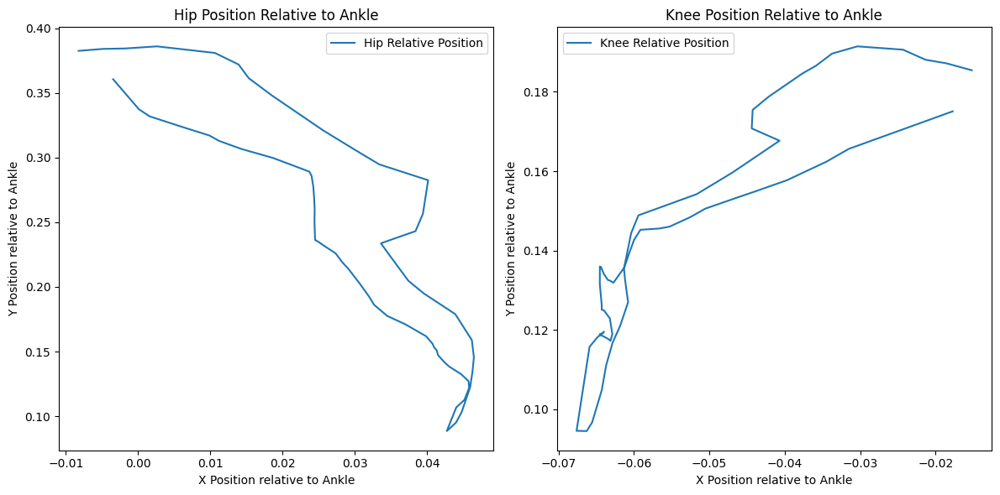

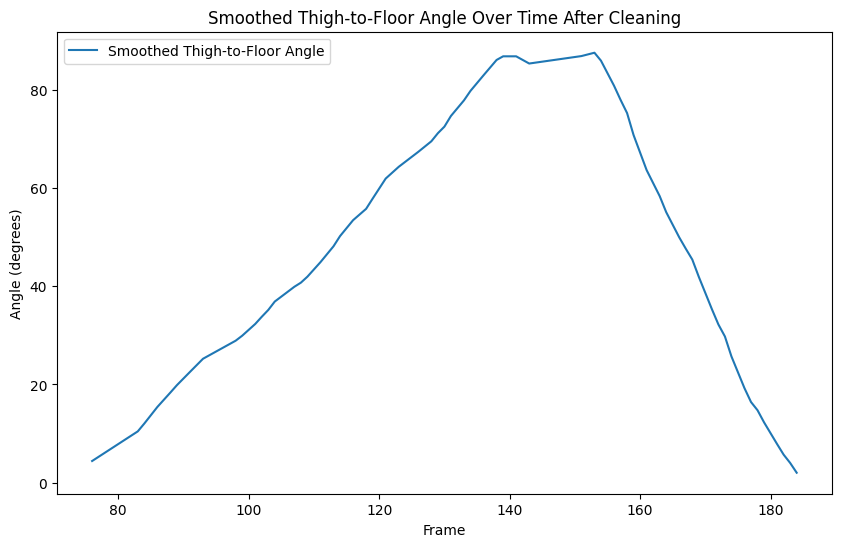

In [115]:
# Example threshold for detecting movement (adjust based on your data)
angle_change_threshold = 1.25  # Degrees

# Calculate the change in angle between consecutive frames
squat_df_cleaned['thigh_angle_change'] = squat_df_cleaned['thigh_to_floor_angle'].diff().abs()

# Filter rows where the change is above the threshold
active_squat_df = squat_df_cleaned[squat_df_cleaned['thigh_angle_change'] > angle_change_threshold]

plt.figure(figsize=(12, 6))

# Hip relative position
plt.subplot(1, 2, 1)
plt.plot(active_squat_df['hip_rel_x'], active_squat_df['hip_rel_y'], label='Hip Relative Position')
plt.xlabel('X Position relative to Ankle')
plt.ylabel('Y Position relative to Ankle')
plt.title('Hip Position Relative to Ankle')
plt.legend()

# Knee relative position
plt.subplot(1, 2, 2)
plt.plot(active_squat_df['knee_rel_x'], active_squat_df['knee_rel_y'], label='Knee Relative Position')
plt.xlabel('X Position relative to Ankle')
plt.ylabel('Y Position relative to Ankle')
plt.title('Knee Position Relative to Ankle')
plt.legend()

plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 6))
plt.plot(active_squat_df['thigh_to_floor_angle_smooth'], label='Smoothed Thigh-to-Floor Angle')
plt.xlabel('Frame')
plt.ylabel('Angle (degrees)')
plt.title('Smoothed Thigh-to-Floor Angle Over Time After Cleaning')
plt.legend()
plt.show()

In [126]:
squat_df_cleaned

,knee_angle,hip_angle,knee_to_ankle_distance,hip_to_floor_distance,hip_rel_x,hip_rel_y,knee_rel_x,knee_rel_y,ankle_rel_x,ankle_rel_y,thigh_to_floor_angle,thigh_to_floor_angle_smooth
0,178.435276,179.481242,0.179726,0.561669,NaN,NaN,NaN,NaN,0.0,0.0,-1.114542,NaN
1,178.087300,179.284017,0.180376,0.561715,NaN,NaN,NaN,NaN,0.0,0.0,-0.916479,NaN
2,177.884905,179.166297,0.180912,0.561750,NaN,NaN,NaN,NaN,0.0,0.0,-0.796878,NaN
3,177.766278,179.092100,0.181342,0.561796,-0.011788,0.362753,-0.008962,0.180366,0.0,0.0,-0.722603,-0.887625
4,177.598516,178.927442,0.182249,0.561671,-0.011648,0.363320,-0.009240,0.180984,0.0,0.0,-0.590326,-0.756571
...,...,...,...,...,...,...,...,...,...,...,...,...
235,178.945222,179.443215,0.168246,0.553788,-0.013870,0.345913,-0.008315,0.167945,0.0,0.0,-1.776781,-1.787825
236,178.943690,179.458485,0.168326,0.553779,-0.013853,0.346116,-0.008313,0.168029,0.0,0.0,-1.773210,-1.781613
237,178.940127,179.459750,0.168361,0.553766,-0.013836,0.346265,-0.008311,0.168085,0.0,0.0,-1.768418,-1.776106
238,178.935106,179.453036,0.168589,0.553757,-0.013813,0.346413,-0.008308,0.168175,0.0,0.0,-1.758359,-1.769192


In [196]:
# SCORING

def identify_bottom_phase(squat_data):
    # Identifying the index of the minimum angle, which represents the deepest point of the squat
    min_angle_index = squat_data['thigh_to_floor_angle_smooth'].idxmin()
    
    # Defining a window around the deepest point
    window_size = 5  # Adjust as needed
    start_index = max(min_angle_index - window_size, 0)  # Ensure the start index is not negative
    end_index = min(min_angle_index + window_size, len(squat_data) - 1)  # Ensure the end index is not out of bounds

    bottom_phase_data = squat_data.iloc[start_index:end_index]

    return bottom_phase_data


def score_depth(squat_data, tolerance):
    bottom_data = identify_bottom_phase(squat_data)

    # Check if each frame in the bottom phase meets the depth criteria
    depth_criteria_met = bottom_data['thigh_to_floor_angle_smooth'] <= 90 + tolerance

    # Score based on the proportion of frames meeting the depth criteria
    depth_score = depth_criteria_met.mean() * 100  # Proportion meeting criteria, scaled to percentage
    
    return depth_score


def score_ascent(squat_data, lower_threshold, upper_threshold):
    # Calculate the angle change rate for ascent
    squat_data['angle_change'] = -squat_data['thigh_to_floor_angle'].diff()

    # Identify the ascent phase
    bottom_index = squat_data['thigh_to_floor_angle'].idxmax()
    ascent_data = squat_data.loc[bottom_index:]
    print(ascent_data['angle_change'].min())
    print(ascent_data['angle_change'].max())
    # Check if each frame is within the desired power range
    in_range = ascent_data['angle_change'].between(lower_threshold, upper_threshold)

    # Score based on the proportion of frames within the range
    ascent_score = in_range.mean() * 100  # Proportion in range, scaled to percentage
    
    return ascent_score

def score_descent(squat_data, lower_threshold, upper_threshold):
    # Calculate the angle change rate for descent
    squat_data['angle_change'] = squat_data['thigh_to_floor_angle'].diff().abs()
    
    # Identify the descent phase
    bottom_index = squat_data['thigh_to_floor_angle'].idxmax()
    descent_data = squat_data.loc[:bottom_index]
    print(descent_data['angle_change'].min())
    print(descent_data['angle_change'].max())

    # Check if each frame is within the desired speed range
    in_range = descent_data['angle_change'].between(lower_threshold, upper_threshold)

    # Score based on the proportion of frames within the range
    descent_score = in_range.mean() * 100  # Proportion in range, scaled to percentage
    
    return descent_score




In [197]:
# Define a new threshold slightly above the maximum observed descent speed
# For example, if 5.9 is the maximum observed speed, you might set the threshold around 6 or 7
speed_threshold = 7
power_threshold = -3
depth_tolerance = 5

# Apply the scoring function to the DataFrame
squat_df_cleaned['descent_score'] = score_descent(squat_df_cleaned, -2, speed_threshold)
squat_df_cleaned['depth_score'] = score_depth(squat_df_cleaned, depth_tolerance)
squat_df_cleaned['ascent_score'] = score_ascent(squat_df_cleaned, -3, 6)
# Check the scores
print(squat_df_cleaned['descent_score'])
print(squat_df_cleaned['depth_score'])
print(squat_df_cleaned['ascent_score'])


0.0022464557500256888
5.246616040647368
-3.0810928124525105
6.197058612986638
0      98.958333
1      98.958333
2      98.958333
3      98.958333
4      98.958333
         ...    
235    98.958333
236    98.958333
237    98.958333
238    98.958333
239    98.958333
Name: descent_score, Length: 240, dtype: float64
0      100.0
1      100.0
2      100.0
3      100.0
4      100.0
       ...  
235    100.0
236    100.0
237    100.0
238    100.0
239    100.0
Name: depth_score, Length: 240, dtype: float64
0      98.62069
1      98.62069
2      98.62069
3      98.62069
4      98.62069
         ...   
235    98.62069
236    98.62069
237    98.62069
238    98.62069
239    98.62069
Name: ascent_score, Length: 240, dtype: float64


In [4]:
import os

mp_pose = mp.solutions.pose
pose  = mp_pose.Pose(static_image_mode=False, model_complexity=1, min_detection_confidence=0.5, min_tracking_confidence=0.5)

# Helper Functions: Preprocessing
def calculate_angle(a, b, c):
    a = np.array(a)  # First
    b = np.array(b)  # Mid
    c = np.array(c)  # End
    
    radians = np.arctan2(c[1]-b[1], c[0]-b[0]) - np.arctan2(a[1]-b[1], a[0]-b[0])
    angle = np.abs(radians*180.0/np.pi)
    
    if angle > 180.0:
        angle = 360-angle
        
    return angle 

def calculate_distance(point1, point2):
    return np.linalg.norm(np.array(point1) - np.array(point2))

def calculate_relative_position(reference, target):
    # Calculate the relative position of the target joint with respect to the reference joint
    relative_position = np.array(target) - np.array(reference)
    return relative_position.tolist()

def process_video_for_squat(video_path):
    cap = cv2.VideoCapture(video_path)
    feature_rows = []

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        results = pose.process(frame_rgb)

        if results.pose_landmarks:
            landmarks = results.pose_landmarks.landmark
            
            # Define keypoints
            shoulder = [landmarks[mp_pose.PoseLandmark.RIGHT_SHOULDER.value].x, landmarks[mp_pose.PoseLandmark.RIGHT_SHOULDER.value].y]
            hip = [landmarks[mp_pose.PoseLandmark.RIGHT_HIP.value].x, landmarks[mp_pose.PoseLandmark.RIGHT_HIP.value].y]
            knee = [landmarks[mp_pose.PoseLandmark.RIGHT_KNEE.value].x, landmarks[mp_pose.PoseLandmark.RIGHT_KNEE.value].y]
            ankle = [landmarks[mp_pose.PoseLandmark.RIGHT_ANKLE.value].x, landmarks[mp_pose.PoseLandmark.RIGHT_ANKLE.value].y]


            # Reference distance (e.g., hip to shoulder)
            ref_distance = calculate_distance(hip, shoulder)

            # Calculate distances
            knee_to_ankle_distance = calculate_distance(knee, ankle)
            hip_to_floor_distance = calculate_distance(hip, [hip[0], 1])  # Simplified floor distance

            # Calculate relative positions
            knee_rel_to_ankle = calculate_relative_position(knee, ankle)
            ankle_rel_to_ankle = calculate_relative_position(ankle, ankle)
            hip_rel_to_ankle = calculate_relative_position(hip, ankle)

            # Calculate angles
            knee_angle = calculate_angle(hip, knee, ankle)
            hip_angle = calculate_angle(shoulder, hip, knee)

            # Append to feature rows
            feature_rows.append([
                knee_angle, hip_angle, 
                knee_to_ankle_distance, hip_to_floor_distance,
                hip_rel_to_ankle[0], hip_rel_to_ankle[1], 
                knee_rel_to_ankle[0], knee_rel_to_ankle[1], 
                ankle_rel_to_ankle[0], ankle_rel_to_ankle[1]
            ])

    cap.release()

    # Define columns for DataFrame
    columns = [
        'knee_angle', 'hip_angle', 
        'knee_to_ankle_distance', 'hip_to_floor_distance', 
        'hip_rel_x', 'hip_rel_y',
        'knee_rel_x', 'knee_rel_y', 
        'ankle_rel_x', 'ankle_rel_y'
    ]
    return pd.DataFrame(feature_rows, columns=columns)

def calculate_thigh_to_floor_angle(hip, knee):
    # Assuming the floor is parallel to the x-axis of the frame
    # and the y-coordinate increases from top to bottom:
    # A horizontal line through the knee has the same y-coordinate as the knee
    # The x-coordinate can be any value that is not the x-coordinate of the knee
    # (for example, knee[0] + 1 to make a horizontal line to the right)
    horizontal = (knee[0] + 1, knee[1])
    
    # Use the calculate_angle function you defined earlier
    angle = calculate_angle(hip, knee, horizontal)
    
    # Since we want the angle relative to the floor, we subtract it from 90 degrees
    # This is because the pose estimation gives the angle with respect to the horizontal,
    # but we want the complement to that angle (the thigh's lift from the horizontal)
    thigh_to_floor_angle = 90 - angle
    
    return thigh_to_floor_angle

# DATA CLEANING:
def clean_df(squat_df):
    squat_df_cleaned = squat_df.dropna()

    # 2. Smoothing Data
    # Apply a simple moving average with a window size you find appropriate
    window_size = 4  # Example window size
    squat_df_cleaned['thigh_to_floor_angle_smooth'] = squat_df_cleaned['thigh_to_floor_angle'].rolling(window=window_size).mean()
    squat_df_cleaned['hip_rel_x'] = squat_df_cleaned['hip_rel_x'].rolling(window=window_size).mean()
    squat_df_cleaned['hip_rel_y'] = squat_df_cleaned['hip_rel_y'].rolling(window=window_size).mean()
    squat_df_cleaned['knee_rel_x'] = squat_df_cleaned['knee_rel_x'].rolling(window=window_size).mean()
    squat_df_cleaned['knee_rel_y'] = squat_df_cleaned['knee_rel_y'].rolling(window=window_size).mean()

    # 3. Removing Outliers
    # Simple statistical method
    # Assume that any data point outside of 3 standard deviations is an outlier
    threshold = 3
    angle_mean = squat_df_cleaned['thigh_to_floor_angle_smooth'].mean()
    angle_std = squat_df_cleaned['thigh_to_floor_angle_smooth'].std()

    outliers = (squat_df_cleaned['thigh_to_floor_angle_smooth'] < angle_mean - threshold * angle_std) | (squat_df_cleaned['thigh_to_floor_angle_smooth'] > angle_mean + threshold * angle_std)
    squat_df_cleaned = squat_df_cleaned[~outliers]
    hip_x_mean = squat_df_cleaned['hip_rel_x'].mean()
    hip_x_std = squat_df_cleaned['hip_rel_x'].std()
    hip_y_mean = squat_df_cleaned['hip_rel_y'].mean()
    hip_y_std = squat_df_cleaned['hip_rel_y'].std()
    knee_x_mean = squat_df_cleaned['knee_rel_x'].mean()
    knee_x_std = squat_df_cleaned['knee_rel_x'].std()
    knee_y_mean = squat_df_cleaned['knee_rel_y'].mean()
    knee_y_std = squat_df_cleaned['knee_rel_y'].std()

    outliers = (squat_df_cleaned['hip_rel_x'] < hip_x_mean - threshold * hip_x_std) | (squat_df_cleaned['hip_rel_x'] > hip_x_mean + threshold * hip_x_std)
    squat_df_cleaned = squat_df_cleaned[~outliers]
    outliers = (squat_df_cleaned['hip_rel_y'] < hip_y_mean - threshold * hip_y_std) | (squat_df_cleaned['hip_rel_y'] > hip_y_mean + threshold * hip_y_std)
    squat_df_cleaned = squat_df_cleaned[~outliers]
    outliers = (squat_df_cleaned['knee_rel_x'] < knee_x_mean - threshold * knee_x_std) | (squat_df_cleaned['knee_rel_x'] > knee_x_mean + threshold * knee_x_std)
    squat_df_cleaned = squat_df_cleaned[~outliers]
    outliers = (squat_df_cleaned['knee_rel_y'] < knee_y_mean - threshold * knee_y_std) | (squat_df_cleaned['knee_rel_y'] > knee_y_mean + threshold * knee_y_std)
    squat_df_cleaned = squat_df_cleaned[~outliers]

    angle_change_threshold = 1.25  # Degrees

    # Calculate the change in angle between consecutive frames
    squat_df_cleaned['thigh_angle_change'] = squat_df_cleaned['thigh_to_floor_angle'].diff().abs()

    # Filter rows where the change is above the threshold
    active_squat_df = squat_df_cleaned[squat_df_cleaned['thigh_angle_change'] > angle_change_threshold]
    return active_squat_df

# SCORING

def identify_bottom_phase(squat_data, window_size=5):
    # Find the index of the maximum thigh-to-floor angle, which should correspond to the deepest squat position
    squat_data.reset_index(drop=True,inplace=True)
    squat_data = squat_data.dropna()
    if squat_data['thigh_to_floor_angle_smooth'].empty:
        # Return an empty DataFrame
        return pd.DataFrame()
    max_angle_index = squat_data['thigh_to_floor_angle_smooth'].idxmax()

    # Define the window around the max angle for the bottom phase
    # Ensure the window doesn't go beyond the DataFrame bounds
    start_index = max(max_angle_index - window_size, 0)
    end_index = min(max_angle_index + window_size, len(squat_data) - 1)

    # Extract the bottom phase data using the defined window
    bottom_phase_data = squat_data.iloc[start_index:end_index + 1]  # +1 because the upper bound is exclusive
    
    return bottom_phase_data

def score_depth(squat_data, tolerance, window_size=2):
    # Identify the bottom phase of the squat
    bottom_data = identify_bottom_phase(squat_data, window_size)
    print("Bottom Data:", bottom_data['thigh_to_floor_angle_smooth'])

    # Proceed with scoring if bottom_data is not empty
    if not bottom_data.empty:
        # Good depth is indicated by angles greater than 90 degrees - tolerance
        # and less than or equal to 90 degrees + tolerance
        depth_criteria_met = ((90 - tolerance) <= bottom_data['thigh_to_floor_angle_smooth']) & \
                             (bottom_data['thigh_to_floor_angle_smooth'] <= (90 + tolerance))
        print("Depth Criteria Met:", depth_criteria_met)  # Debug statement

        # Calculate the depth score as the proportion of frames meeting the depth criteria
        depth_score = (depth_criteria_met.sum() / len(bottom_data)) * 100
        print("Depth Score:", depth_score)  # Debug statement
    else:
        # Handle cases where the bottom phase data is empty
        depth_score = 0

    return depth_score



def score_ascent(squat_data, lower_threshold, upper_threshold):
    if not squat_data.empty and 'thigh_to_floor_angle' in squat_data.columns and not squat_data['thigh_to_floor_angle'].empty:
        # Calculate the angle change rate for ascent
        squat_data['angle_change'] = -squat_data['thigh_to_floor_angle'].diff()

        # Identify the ascent phase
        if not squat_data['angle_change'].empty:
            bottom_index = squat_data['thigh_to_floor_angle'].idxmax()
            ascent_data = squat_data.loc[bottom_index:]

            # Check if each frame is within the desired power range
            in_range = ascent_data['angle_change'].between(lower_threshold, upper_threshold)

            # Score based on the proportion of frames within the range
            ascent_score = in_range.mean() * 100  # Proportion in range, scaled to percentage
        else:
            ascent_score = 0  # Default score if data is empty
    else:
        ascent_score = 0  # Default score if data is empty or column is missing

    return ascent_score

def score_descent(squat_data, lower_threshold, upper_threshold):
    # Calculate the angle change rate for descent
    squat_data['angle_change'] = squat_data['thigh_to_floor_angle'].diff().abs()
    
    # Identify the descent phase
    try:
        bottom_index = squat_data['thigh_to_floor_angle'].idxmax()
    except ValueError:
        bottom_index = 0
    descent_data = squat_data.loc[:bottom_index]

    # Check if each frame is within the desired speed range
    in_range = descent_data['angle_change'].between(lower_threshold, upper_threshold)

    # Score based on the proportion of frames within the range
    descent_score = in_range.mean() * 100  # Proportion in range, scaled to percentage
    
    return descent_score

def preprocess_score_squat(video_path):
   
   squat_df = process_video_for_squat(video_path)

   squat_df['thigh_to_floor_angle'] = squat_df.apply(
    lambda row: calculate_thigh_to_floor_angle(
        [row['hip_rel_x'], row['hip_rel_y']], 
        [row['knee_rel_x'], row['knee_rel_y']]
    ), axis=1)
   
   if squat_df.any().any():
        # Clean the DataFrame
        squat_df_cleaned = clean_df(squat_df) 
        if squat_df_cleaned.empty:
            print("The DataFrame is empty after cleaning and cannot be scored.")
            return None
        # Apply the scoring functions
        squat_df_cleaned['descent_score'] = score_descent(squat_df_cleaned, -2, 7)
        squat_df_cleaned['depth_score'] = score_depth(squat_df_cleaned, 10)
        squat_df_cleaned['ascent_score'] = score_ascent(squat_df_cleaned, -3, 6)

        return squat_df_cleaned
   else:
        # Handle the empty DataFrame case
        print("The DataFrame is empty and cannot be processed.")
        return None


video_files = [file for file in os.listdir("/Users/tomhucke/TrainingCompanion/training-companion/ml/videos/squat") if file.endswith(".mp4")]
all_processed_data = []

for file in video_files:
    video_path = os.path.join("/Users/tomhucke/TrainingCompanion/training-companion/ml/videos/squat", file)
    print('Preprocessing File: ', file, '...')
    try:
        processed_data = preprocess_score_squat(video_path)
        all_processed_data.append(processed_data)
        print('Done!')
    except Exception as e:
        print(f"Error processing file: {file}: {e}")

all_processed_data = [df for df in all_processed_data if df is not None]

for i, processed_data in enumerate(all_processed_data):
    processed_data['repetition'] = i + 1

combined_data = pd.concat(all_processed_data)

I0000 00:00:1705661182.791054       1 gl_context.cc:344] GL version: 2.1 (2.1 Metal - 88), renderer: Apple M2
INFO: Created TensorFlow Lite XNNPACK delegate for CPU.


Preprocessing File:  rep_fourteen-squat-correct-tom.mp4 ...
Bottom Data: 26    83.003047
27    87.488203
28    86.172217
29    84.703190
30    81.293998
Name: thigh_to_floor_angle_smooth, dtype: float64
Depth Criteria Met: 26    True
27    True
28    True
29    True
30    True
Name: thigh_to_floor_angle_smooth, dtype: bool
Depth Score: 100.0
Done!
Preprocessing File:  r26_tom_correct.mp4 ...
Bottom Data: 27    87.746832
28    88.972293
29    83.867466
30    82.488968
31    77.922705
Name: thigh_to_floor_angle_smooth, dtype: float64
Depth Criteria Met: 27     True
28     True
29     True
30     True
31    False
Name: thigh_to_floor_angle_smooth, dtype: bool
Depth Score: 80.0
Done!
Preprocessing File:  rep_two-squat-correct-chrissi.mp4 ...
Bottom Data: 26    80.611441
27    86.832944
28    83.351912
29    80.462351
30    73.637412
Name: thigh_to_floor_angle_smooth, dtype: float64
Depth Criteria Met: 26     True
27     True
28     True
29     True
30    False
Name: thigh_to_floor_angle_sm

In [7]:

combined_data['ascent_score'].describe()

count    7001.000000
mean       87.725904
std         7.943167
min        33.333333
25%        82.758621
50%        88.636364
75%        92.857143
max       100.000000
Name: ascent_score, dtype: float64

In [245]:
combined_data.to_csv('squat_data.csv', index=False)

In [12]:
from sklearn.model_selection import train_test_split
from sklearn.multioutput import MultiOutputRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from xgboost import XGBRegressor

# Assuming `combined_data` is your DataFrame and `targets` is your list of target variables
targets = ['descent_score', 'ascent_score', 'depth_score']
X = combined_data.drop(targets, axis=1)
X = X.drop('angle_change', axis=1)
y = combined_data[targets]

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Training
model = MultiOutputRegressor(XGBRegressor())
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)

for i, target in enumerate(targets):
    mse = mean_squared_error(y_test.iloc[:, i], y_pred[:, i])
    mae = mean_absolute_error(y_test.iloc[:, i], y_pred[:, i])
    r2 = r2_score(y_test.iloc[:, i], y_pred[:, i])

    print(f"Metrics for {target}:")
    print(f"Mean Squared Error: {mse}")
    print(f"Mean Absolute Error: {mae}")
    print(f"R2 Score: {r2}")
    print("\n")

   knee_angle   hip_angle  knee_to_ankle_distance  hip_to_floor_distance  \
0  174.359169  171.687828                0.179277               0.551655   
1  170.117226  168.560308                0.179434               0.549457   
2  164.836620  164.613476                0.179924               0.543589   
3  159.600171  160.200432                0.178451               0.535969   
4  155.239078  156.394182                0.180153               0.527916   

   hip_rel_x  hip_rel_y  knee_rel_x  knee_rel_y  ankle_rel_x  ankle_rel_y  \
0  -0.003972   0.381729   -0.008042    0.180488          0.0          0.0   
1  -0.000849   0.379789   -0.010880    0.179099          0.0          0.0   
2   0.001749   0.374607   -0.016757    0.179149          0.0          0.0   
3   0.005138   0.367246   -0.023782    0.177252          0.0          0.0   
4   0.007569   0.360610   -0.028395    0.176192          0.0          0.0   

   thigh_to_floor_angle  thigh_to_floor_angle_smooth  thigh_angle_change  \
0   

/Users/tomhucke/anaconda3/envs/compApp/lib/python3.11/site-packages/xgboost/data.py:312: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(dtype):
/Users/tomhucke/anaconda3/envs/compApp/lib/python3.11/site-packages/xgboost/data.py:314: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  elif is_categorical_dtype(dtype) and enable_categorical:
/Users/tomhucke/anaconda3/envs/compApp/lib/python3.11/site-packages/xgboost/data.py:345: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if is_categorical_dtype(dtype)
/Users/tomhucke/anaconda3/envs/compApp/lib/python3.11/site-packages/xgboost/data.py:336: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, Categor

Metrics for descent_score:
Mean Squared Error: 4.4823238766653954
Mean Absolute Error: 0.9416936862622787
R2 Score: 0.9085907502048844


Metrics for ascent_score:
Mean Squared Error: 2.379701879896166
Mean Absolute Error: 0.8833253138317242
R2 Score: 0.9566603629130174


Metrics for depth_score:
Mean Squared Error: 71.77535128661829
Mean Absolute Error: 5.300567403850515
R2 Score: 0.9335652511092557




/Users/tomhucke/anaconda3/envs/compApp/lib/python3.11/site-packages/xgboost/data.py:312: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(dtype):
/Users/tomhucke/anaconda3/envs/compApp/lib/python3.11/site-packages/xgboost/data.py:314: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  elif is_categorical_dtype(dtype) and enable_categorical:
/Users/tomhucke/anaconda3/envs/compApp/lib/python3.11/site-packages/xgboost/data.py:345: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if is_categorical_dtype(dtype)
/Users/tomhucke/anaconda3/envs/compApp/lib/python3.11/site-packages/xgboost/data.py:336: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, Categor

In [13]:
import joblib

joblib.dump(model, 'squat_model.pkl')

['squat_model.pkl']